In [117]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [118]:
# import os
# path = "/content/gdrive/My Drive/Colab Notebooks/CMPT733/Project"
# os.chdir(path)
# os.listdir(path)

In [3]:
!pip install haversine
!pip install rtree

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.6 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from haversine import haversine, Unit
import rtree.index
import scipy.stats

# 2.1 Airbnb

In [5]:
df_listings = pd.read_csv("listings.csv")
df_calendar = pd.read_csv('calendar.csv')
df_reviews = pd.read_csv('reviews.csv')
df_calendar.head(3)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,13358,2022-12-11,f,$150.00,$150.00,3.0,90.0
1,13358,2022-12-12,t,$150.00,$150.00,3.0,90.0
2,13358,2022-12-13,t,$150.00,$150.00,3.0,90.0


In [6]:
len(df_listings)

5676

In [7]:
df_listings.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

## Add neighbourhoods of Vancouver
### Downtown peninsula, East Side, West Side

In [8]:
def label_neighbourhood(value):
    if value in ["West End", "Yaletown", "Downtown Eastside", "Downtown"]:
        return "Downtown peninsula"
    if value in ["Kensington-Cedar Cottage", "Hastings-Sunrise", "Grandview-Woodland", "Renfrew-Collingwood", "Mount Pleasant", "Riley Park", "Strathcona",
                 "Sunset", "Victoria-Fraserview","Killarney"]:
        return "East Side"
    if value in ["Kitsilano", "Arbutus Ridge", "Dunbar Southlands", "Fairview", "South Cambie", "West Point Grey", "Marpole", "Kerrisdale",
                 "Shaughnessy", "Oakridge"]:
        return "West Side"
df_listings["neighbourhood_group"] = df_listings['neighbourhood'].map(label_neighbourhood)
# df_listings.isnull().sum()

In [9]:
data = df_listings.copy()

In [10]:
data.neighbourhood_group.unique()

array(['Downtown peninsula', 'East Side', 'West Side'], dtype=object)

In [11]:
#Downtown peninsula
sub_1=data.loc[data['neighbourhood_group'] == 'Downtown peninsula']
price_sub1=sub_1[['price']]
#East Side
sub_2=data.loc[data['neighbourhood_group'] == 'East Side']
price_sub2=sub_2[['price']]
#West Side
sub_3=data.loc[data['neighbourhood_group'] == 'West Side']
price_sub3=sub_3[['price']]
#putting all the prices' dfs in the list
price_list_by_n=[price_sub1, price_sub2, price_sub3]

In [12]:
p_l_b_n_2=[]
#creating list with known values in neighbourhood_group column
nei_list=['Downtown peninsula', 'East Side', 'West Side']
#creating a for loop to get statistics for price ranges and append it to our empty list
for x in price_list_by_n:
    i=x.describe(percentiles=[.25, .50, .75])
    i=i.iloc[3:]
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Stats'}, inplace=True)
    p_l_b_n_2.append(i)
#changing names of the price column to the area name for easier reading of the table    
p_l_b_n_2[0].rename(columns={'price':nei_list[0]}, inplace=True)
p_l_b_n_2[1].rename(columns={'price':nei_list[1]}, inplace=True)
p_l_b_n_2[2].rename(columns={'price':nei_list[2]}, inplace=True)
#finilizing our dataframe for final view    
stat_df=p_l_b_n_2
stat_df=[df.set_index('Stats') for df in stat_df]
stat_df=stat_df[0].join(stat_df[1:])
stat_df

,Downtown peninsula,East Side,West Side
Stats,,,
min,27.0,20.0,28.0
25%,120.0,87.0,95.0
50%,156.0,122.0,139.0
75%,225.0,182.0,221.0
max,119149.0,99120.0,20000.0


In [13]:
sub_6=data[data.price < 600]
fig = go.Figure()
days = ['Downtown peninsula', 'East Side', 'West Side']
for day in days:
    fig.add_trace(go.Violin(x=sub_6['neighbourhood_group'][sub_6['neighbourhood_group'] == day],
                            y=sub_6['price'][sub_6['neighbourhood_group'] == day],
                            name=day,
                            box_visible=True,
                            meanline_visible=True))
fig.update_layout(
    title_text="Density and distribution of prices for each neighberhood_group")
fig.show()

In [84]:
fig = px.scatter_mapbox(sub_6, lat='latitude', lon='longitude', color='price',
                        color_continuous_scale='jet', size='availability_365',
                        hover_name='name', size_max=6, zoom=10, height=600)

fig.update_layout(mapbox_style='open-street-map')
fig.show()


In [86]:
df_Downtown = sub_6[sub_6["neighbourhood_group"] == "Downtown peninsula"]
df_East = sub_6[sub_6["neighbourhood_group"] == "East Side"]
df_West = sub_6[sub_6["neighbourhood_group"] == "West Side"]

In [116]:
trace1 = go.Scattermapbox(lat=df_Downtown['latitude'],
                          lon=df_Downtown['longitude'],
                          text=df_Downtown['name'],
                          name='Downtown peninsula',
                          mode='markers',
                          marker=dict(size=df_Downtown['availability_365'] / max(df_Downtown['availability_365']) * 6,
                                      color=df_Downtown['price'],
                                      colorscale=[[0, "rgb(240,230,140)"], [0.5, "rgb(255,140,0)"], [1.0, "rgb(139,69,19)"]],
                                      showscale=True),
                          hoverinfo='text')

trace2 = go.Scattermapbox(lat=df_East['latitude'],
                          lon=df_East['longitude'],
                          text=df_East['name'],
                          name='East Side',
                          mode='markers',
                          marker=dict(size=df_East['availability_365'] / max(df_East['availability_365']) * 6,
                                      color=df_East['price'],
                                      colorscale=[[0, "rgb(173,216,230)"], [0.5, "rgb(100,149,237)"], [1.0, "rgb(0,0,128)"]],
                                      showscale=True),
                          hoverinfo='text')

trace3 = go.Scattermapbox(lat=df_West['latitude'],
                          lon=df_West['longitude'],
                          text=df_West['name'],
                          name='West Side',
                          mode='markers',
                          marker=dict(size=df_West['availability_365'] / max(df_West['availability_365']) * 6,
                                      color=df_West['price'],
                                      colorscale=[[0, "rgb(255, 204, 204)"], [0.5, "rgb(255, 102, 102)"], [1.0, "rgb(255, 0, 0)"]],
                                      showscale=True),
                          hoverinfo='text')
# Combine both traces into a single figure
fig = go.Figure([trace1, trace2, trace3])

# Set the mapbox style and layout
token = "pk.eyJ1Ijoic3RlbGxhNjc4OCIsImEiOiJjbGZ1azI2b3EwMng2M2Ztem43cmc2aGkyIn0.AMalz4Oun7_Y3-vsQ37RoA"
fig.update_layout(mapbox_style='carto-positron', mapbox_zoom=11, mapbox_center_lat=49.281, mapbox_center_lon=-123.14,
                  mapbox = {'accesstoken': token,'style': "outdoors"}, showlegend = False, width=1000, height=600)

fig.update_layout(title='Visualization of Airbnb Listings and Cultural Hotspots')
fig.show()

In [15]:
# def handle_price(df):
#     df['price']=df['price'].map(lambda v: float(v[1:].replace(",","")) if type(v) != float else v)
#     return df

In [16]:
# handle_price(df_calendar)

In [17]:
df_calendar['available'].replace({'t':1,'f':0},inplace=True)
df_calendar['month']=pd.DatetimeIndex(df_calendar['date']).month
df_calendar['year']=pd.DatetimeIndex(df_calendar['date']).year
df_calendar['year'] = df_calendar['year'] - 1
df_calendar['Month_Year'] = pd.to_datetime(df_calendar['date'])
# df_calendar['Month_Year'] = df_calendar['Month_Year'] - pd.DateOffset(years=1)
df_calendar['Month_Year'] = df_calendar['Month_Year'].dt.to_period('M')

df_calendar.head(5)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,month,year,Month_Year
0,13358,2022-12-11,0,$150.00,$150.00,3.0,90.0,12,2021,2022-12
1,13358,2022-12-12,1,$150.00,$150.00,3.0,90.0,12,2021,2022-12
2,13358,2022-12-13,1,$150.00,$150.00,3.0,90.0,12,2021,2022-12
3,13358,2022-12-14,1,$150.00,$150.00,3.0,90.0,12,2021,2022-12
4,13358,2022-12-15,1,$150.00,$150.00,3.0,90.0,12,2021,2022-12


## Availibility during the Next 12 months

<Axes: title={'center': 'Avg Availability per Month'}, xlabel='Month_Year', ylabel='avg_availability'>

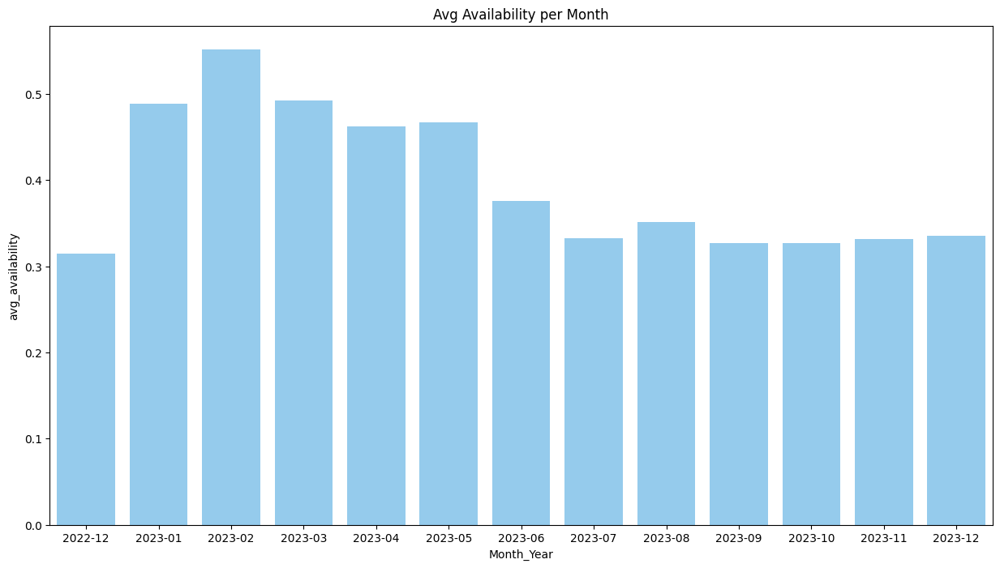

In [18]:
availibility=df_calendar.groupby('Month_Year')['available'].mean().reset_index().rename(columns={'available':'avg_availability'})

x=availibility['Month_Year']
y=availibility['avg_availability']

plt.figure(figsize=(15,8))
plt.title("Avg Availability per Month")

sns.barplot(data=availibility,x='Month_Year',y='avg_availability',color= 'LightSkyBlue',palette=None)
# availibility.sort_values(by='avg_availability',ascending=False)


In [19]:
avail_listing_cond = df_calendar['available'] == 1  # select all available listing
avail_listing_df = df_calendar.loc[avail_listing_cond, :]

list_mon_grouped = avail_listing_df.groupby('month').count()
# ax2_2 = sns.barplot(x=list_mon_grouped.index.values, y=list_mon_grouped['listing_id'].values)
# ax2_2.set_ylim(50000, 300000)
# ax2_2.set_ylabel("Number of listing")
# ax2_2.set_xlabel("Month")
# ax2_2.set_title("Distribution of listing from January to December")



trace = go.Bar(
    x=list_mon_grouped.index.values,
    y=list_mon_grouped['listing_id'].values,
    marker=dict(color='PowderBlue')
)
layout = go.Layout(
    xaxis=dict(title='Month'),
    yaxis=dict(title='Number of listing', range=[50000, 90000]),
    title='Distribution of listing from January to December'
)

fig = go.Figure(data=[trace], layout=layout)
fig.show()

In [20]:
fig = px.histogram(df_listings, x='neighbourhood_group', color='room_type')
fig.update_layout(xaxis_tickangle=-90,
                  xaxis_title='Neighbourhood_group', yaxis_title='# of listings')
fig.show()

In [21]:
# new = df_reviews.groupby(['Month']).count()[['reviewer_id']].sort_values(by = 'reviewer_id', ascending = False)
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218099 entries, 0 to 218098
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  218099 non-null  int64 
 1   date        218099 non-null  object
dtypes: int64(1), object(1)
memory usage: 3.3+ MB


## Top neighbour

In [22]:
Top_neighbour_per_price=df_listings.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).reset_index().rename(columns={'price':'avg_price'})

x=Top_neighbour_per_price['neighbourhood'].head(5)
y=Top_neighbour_per_price['avg_price'].head(5)

# plt.figure(figsize=(15,8))
# plt.title("Top neighbourhood in terms of Price/night")
# sns.barplot(data=Top_neighbour_per_price,x=x,y=y,color='PowderBlue',palette=None)
# Top_neighbour_per_price.head(5)

# fig = px.bar(x=x, y=y, title="Top neighbourhood in terms of average price/night")
# fig.update_layout(xaxis_title='Neighbourhood_group', yaxis_title='Price')
# fig.show()

fig = px.bar(x=x, y=y, title="Top neighbourhood in terms of average price/night", color=x)
fig.update_layout(xaxis_title='Neighbourhood_group', yaxis_title='Price')
fig.show()

# 2.2 BC Assessment

In [23]:
BCA_df = pd.read_csv("property_tax_report_2021.csv", sep=';')

BCA_df['CURRENT_PRICE'] = BCA_df.apply(lambda x: x['CURRENT_LAND_VALUE']+x['CURRENT_IMPROVEMENT_VALUE'], axis = 1)

BCA_df['PREVIOUS_PRICE'] = BCA_df.apply(lambda x: x['PREVIOUS_LAND_VALUE']+x['PREVIOUS_IMPROVEMENT_VALUE'], axis = 1)


In [24]:
rldf = pd.read_csv('pccf_record_layout.csv')
# load the raw text pccf file
with open('pccfNat_fccpNat_052021.txt','r', encoding='latin-1') as fh:
    pctxt = fh.read()
pclines = pctxt.split('\n')
pclines = list(filter(lambda l: len(l), pclines)) # keep only non-empty lines

pclines_tmp = pd.Series(pclines)
def gen_pccf():
    for idx, r in rldf.iterrows():
        slice_values = pclines_tmp.str[r['Position']-1:r['Position']+r['Size']-1]
        yield r['Field name'], slice_values
pccf_df = pd.DataFrame(dict(gen_pccf()))

pccf_df['LAT'] = pccf_df['LAT'].astype(float)
pccf_df['LONG'] = pccf_df['LONG'].astype(float)
pccf_short = pccf_df[['Postal code', 'LONG', 'LAT', 'CSDname']]
pccf_short = pccf_short.groupby('Postal code').agg({'LONG':'mean','LAT':'mean','CSDname':'first'})

In [25]:
BCA_df['Postal code'] = BCA_df['PROPERTY_POSTAL_CODE'].str.replace(' ','')
dfgeo = BCA_df.merge(pccf_short, on='Postal code')
dfgeo.head(5)

,PID,LEGAL_TYPE,FOLIO,LAND_COORDINATE,ZONING_DISTRICT,ZONING_CLASSIFICATION,LOT,PLAN,BLOCK,DISTRICT_LOT,...,BIG_IMPROVEMENT_YEAR,TAX_LEVY,NEIGHBOURHOOD_CODE,REPORT_YEAR,CURRENT_PRICE,PREVIOUS_PRICE,Postal code,LONG,LAT,CSDname
0,002-582-759,STRATA,90717090036,9071709,CD-1 (94),Comprehensive Development,36,VAS452,NaN,526,...,1977.0,3644.37,4,2021,1247000.0,1130000.0,V6L3C7,-123.154007,49.247557,Vancouver ...
1,004-050-002,STRATA,90717090032,9071709,CD-1 (94),Comprehensive Development,32,VAS452,NaN,526,...,1982.0,3767.11,4,2021,1289000.0,1302000.0,V6L3C7,-123.154007,49.247557,Vancouver ...
2,004-050-002,STRATA,90717090032,9071709,CD-1 (94),Comprehensive Development,32,VAS452,NaN,526,...,1982.0,3809.24,4,2020,1302000.0,1680000.0,V6L3C7,-123.154007,49.247557,Vancouver ...
3,004-049-985,STRATA,90717090030,9071709,CD-1 (94),Comprehensive Development,30,VAS452,NaN,526,...,1977.0,3788.75,4,2020,1295000.0,1674000.0,V6L3C7,-123.154007,49.247557,Vancouver ...
4,004-049-977,STRATA,90717090029,9071709,CD-1 (94),Comprehensive Development,29,VAS452,NaN,526,...,1977.0,3752.49,4,2021,1284000.0,1295000.0,V6L3C7,-123.154007,49.247557,Vancouver ...


In [26]:
dfgeo_van = dfgeo[dfgeo['LAT'] < 49.31]

In [27]:
q_high = dfgeo_van['CURRENT_PRICE'].quantile(0.95)
q_low = dfgeo_van['CURRENT_PRICE'].quantile(0.05)

In [28]:
len(dfgeo_van)

635146

In [29]:
dfgeo_van_filtered = dfgeo_van[(dfgeo_van['CURRENT_PRICE'] <= q_high) & (dfgeo_van['CURRENT_PRICE'] >= q_low)]
len(dfgeo_van_filtered)

567875

In [30]:
test_airbnb = sub_6

In [31]:
dfgeo_van_filtered = dfgeo_van_filtered.rename(columns={"LONG": "longitude", "LAT": "latitude"})

In [32]:
# below two code blockes are commented to save running time

In [33]:
# idx = rtree.index.Index()

# def insert_into_index(row):
#     coord = (row['longitude'], row['latitude'], row['longitude'], row['latitude'])
#     idx.insert(row.name, coord)

# dfgeo_van_filtered.apply(insert_into_index, axis=1)

In [34]:
# def find_average_nearest_price(coords, idx, k=5):
#     lat, lon = coords
#     search_radius = 0.001
#     nearest = []
#     it = 0
#     while len(nearest) < k and it < 2:
#         bounds = (lon - search_radius, lat - search_radius, lon + search_radius, lat + search_radius)       
#         nearest = list(idx.intersection(bounds))
#         search_radius *= 2
#         it+=1
#     # print(nearest)
    
#     nearest_distances = [haversine(coords, (dfgeo_van_filtered.loc[i]['latitude'], dfgeo_van_filtered.loc[i]['longitude'])) for i in nearest]
#     nearest_rows = dfgeo_van_filtered.loc[nearest].copy()
#     nearest_rows['distance'] = nearest_distances
#     nearest_rows.sort_values(by='distance', inplace=True)
#     nearest_rows = nearest_rows.head(k)
#     average_price = nearest_rows['CURRENT_PRICE'].mean()
#     return average_price
    

# # Apply the function to the test_airbnb coordinates
# test_airbnb['average_nearest_price'] = test_airbnb.apply(lambda row: find_average_nearest_price((row['latitude'], row['longitude']), idx), axis=1)



In [35]:
# test_airbnb.to_csv('knn_complete_2.csv',index=False)
# 762sec run time saver.

In [36]:
# 762 sec + run time saver.
test_airbnb = pd.read_csv('knn_complete_2.csv')  

In [37]:
sample = dfgeo_van_filtered.sample(frac=0.3, random_state=42) 

fig = px.scatter_mapbox(sample, lat='latitude', lon='longitude', color= "CURRENT_PRICE", 
                        color_continuous_scale='jet', size_max=6, zoom=11,
                        mapbox_style='open-street-map', width=1000, height=600)
fig.update_layout(title='Heatmap of Housing Prices in Vancouver')
fig.show()

In [38]:
fig = px.scatter_mapbox(test_airbnb, lat='latitude', lon='longitude', color= "average_nearest_price", 
                        color_continuous_scale='jet', size_max=6, zoom=11,
                        mapbox_style='open-street-map', width=1000, height=600)
fig.update_layout(title='Heatmap of Average Nearest Housing Prices for Airbnb Listings')

fig.show()

In [39]:
fig = px.scatter(test_airbnb, x='average_nearest_price', y='price', trendline='ols',trendline_color_override="orange")
fig.update_layout(
    title='Correlation Between Average Nearest Housing Price & Airbnb Prices',
    xaxis_title='House Price',
    yaxis_title='Airbnb Price',
    font=dict(size=14),
    plot_bgcolor='white',
    hovermode='x unified'
)

fig.update_xaxes(showgrid=True, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridcolor='LightGray')

fig.show()

In [40]:
import pandas as pd
import plotly.express as px

# Divide the data into groups based on average nearest housing price
test_airbnb['price_group'] = pd.cut(test_airbnb['average_nearest_price'], bins=[0, 1000000, 2000000, 3000000, float('inf')], labels=['<1m', '1m-2m', '2m-3m', '>3m'])

# Calculate the correlation for each group
correlations = test_airbnb.groupby('price_group').corr().loc[(slice(None), 'price'), 'average_nearest_price'].reset_index()
correlations = correlations.rename(columns={'average_nearest_price': 'correlation'})

# Plot the correlations
fig = px.bar(correlations, x='price_group', y='correlation', color='price_group', 
             title='Correlation Between Average Nearest Housing Price & Airbnb Prices (by Housing Price Group)',
             labels={'correlation': 'Correlation', 'price_group': 'Housing Price Group'})
fig.update_layout(font=dict(size=14), plot_bgcolor='white')
fig.update_xaxes(showgrid=True, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridcolor='LightGray')
fig.show()


In [41]:
# # Remove rows with NaN values
# test_airbnb = test_airbnb.dropna()

# # Prepare input and output data
# X = test_airbnb['average_nearest_price'].values.reshape((-1, 1))
# y = test_airbnb['price'].values

# # Transform input data to include polynomial features
# transformer = PolynomialFeatures(degree=16, include_bias=False)
# X_ = transformer.fit_transform(X)

# # Fit the model using Linear Regression
# model = LinearRegression().fit(X_, y)

# # Make predictions using the model
# y_pred = model.predict(X_)

# # Visualize the model
# plt.scatter(X, y, color='black')
# plt.plot(X, y_pred, color='blue', linewidth=3)
# plt.title('Polynomial Regression')
# plt.xlabel('X')
# plt.ylabel('y')
# plt.show()


**House price itself has little impact on Airbnb pricing.** \\
House prices and Airbnb pricing are driven by different factors. House prices are typically influenced by factors like location, size, condition, and local real estate market trends. On the other hand, Airbnb pricing is influenced by factors such as short-term demand, seasonality, the host's desired income, and the amenities offered. While the location can affect both, the unique characteristics of short-term rentals make it so that Airbnb pricing is less dependent on the local housing market. Hosts often have more flexibility in adjusting their rates based on various factors, like local events, tourist season, or even personal preferences, making the connection between house prices and Airbnb pricing relatively weak.

### Pearson's correlation coefficient hypothesis test

In [42]:
temp = test_airbnb.dropna()

In [43]:
x = temp['average_nearest_price'].tolist()
y = temp['price'].tolist()

In [44]:
correlation_coefficient, p_value = scipy.stats.pearsonr(x, y)

print("Correlation coefficient:", correlation_coefficient)
print("P-value:", p_value)

alpha = 0.05

if p_value < alpha:
    print("Reject the null hypothesis. There is a significant correlation.")
else:
    print("Fail to reject the null hypothesis. There is no significant correlation.")

Correlation coefficient: -0.03290197087804836
P-value: 0.04939477352755218
Reject the null hypothesis. There is a significant correlation.


# 2.3 Census [archived]

In [45]:
# cen_df = pd.read_csv("98-401-X2021025_English_CSV_data.csv", encoding='latin-1')

In [46]:
# cen_df_van = cen_df[(cen_df["GEO_NAME"] == "Metro Vancouver A, Regional district electoral area (RDA)") |
#                     (cen_df["GEO_NAME"] == "Vancouver, City (CY)")]
# # cen_df_van.to_csv("tmp.csv")

# display(cen_df_van)

# 2.3 Rental 

In [23]:
rental = pd.read_csv("craiglist.csv",encoding='cp1252')
rental['price'] = rental['price'].str.replace(',','').astype(float)
rental = rental.dropna()
rental

,title,url,price,latitude,longitude
0,"2BD 1BA, Bike Storage, Quartz countertops",https://vancouver.craigslist.org/van/apa/d/van...,3550.0,49.283300,-123.129800
1,GRAND OPENING Pet friendly Studios at 55One 55...,https://vancouver.craigslist.org/pml/apa/d/coq...,1995.0,49.260632,-122.888238
2,Coquitlam Center one bedroom suite newly renov...,https://vancouver.craigslist.org/pml/apa/d/coq...,1800.0,49.269881,-122.794747
3,South Surrey Suite for Rent by Hugh & McKinnon...,https://vancouver.craigslist.org/rds/apa/d/sur...,2300.0,49.027829,-122.747154
4,Newly Renovated 2 Bedrooms & 1 Bathroom,https://vancouver.craigslist.org/van/apa/d/van...,2100.0,49.239700,-123.040700
...,...,...,...,...,...
2395,"1100 Sqft, Beautifully Furnished 2 bdrm Condo",https://vancouver.craigslist.org/van/apa/d/van...,5380.0,49.276700,-123.130000
2396,Two bedroom plus den,https://vancouver.craigslist.org/bnc/apa/d/new...,3000.0,49.211923,-122.935252
2397,"D9 - One of a kind rare apartment, amazing wat...",https://vancouver.craigslist.org/van/apa/d/van...,7500.0,49.278800,-123.113900
2398,3 Bed 2.5 Bath House for rent,https://vancouver.craigslist.org/rds/apa/d/sur...,3300.0,49.126677,-122.680936


In [24]:
rental.dtypes

title         object
url           object
price        float64
latitude     float64
longitude    float64
dtype: object

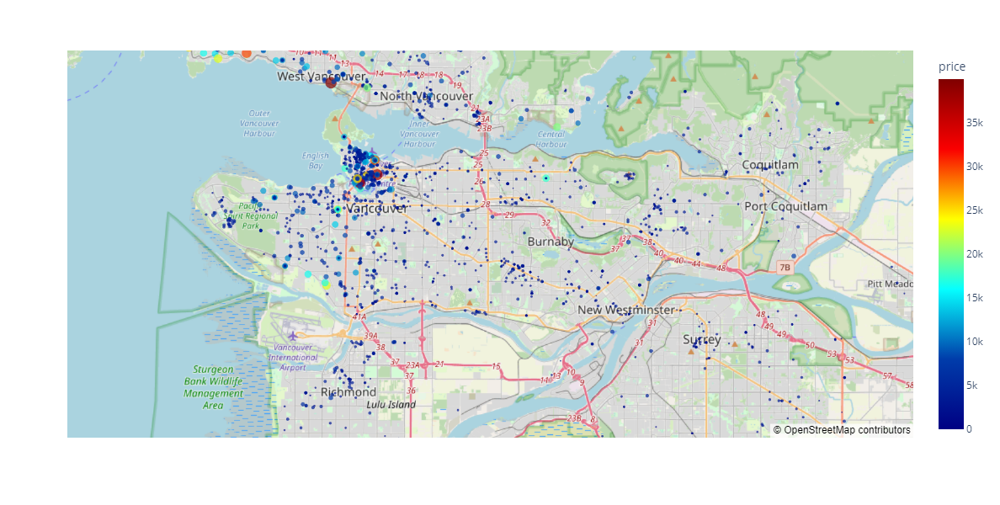

In [26]:
fig = px.scatter_mapbox(rental, lat='latitude', lon='longitude', color='price',
                        color_continuous_scale='jet', size='price',
                        hover_name='title', size_max=10, zoom=10, height=600)

fig.update_layout(mapbox_style='open-street-map')
fig.show()

In [31]:
def insert_into_index(row):
    coord = (row['longitude'], row['latitude'], row['longitude'], row['latitude'])
    idx.insert(row.name, coord)

In [32]:
def find_average_nearest_price_rental(coords, idx, test = True, k=5):
    lat, lon = coords
    search_radius = 0.001
    nearest = []
    it = 0
    while len(nearest) < k and it < 5:
        bounds = (lon - search_radius, lat - search_radius, lon + search_radius, lat + search_radius)
        nearest = list(idx.intersection(bounds))
        search_radius *= 2
        it+=1
    # print(nearest)

    nearest_distances = [haversine(coords, (df.loc[i]['latitude'], df.loc[i]['longitude'])) for i in nearest]
    nearest_rows = df.loc[nearest].copy()
    nearest_rows['distance'] = nearest_distances
    nearest_rows.sort_values(by='distance', inplace=True)
    nearest_rows = nearest_rows.head(k)
    average_price = nearest_rows['price'].mean()
    return average_price

In [33]:
test_longitude = -123.2437
test_latitude = 49.253

df = rental
idx = rtree.index.Index()
df.apply(insert_into_index, axis=1)

find_average_nearest_price_rental((test_latitude, test_longitude), idx)


4490.0

# 2.4 Cultural Hotspot: points of interest

In [47]:
df_hotspot = pd.read_csv("cultural-spaces.csv", sep=';')

df_hotspot_filter = df_hotspot[["TYPE", "Geom", "geo_point_2d"]]
df_hotspot_filter.head(5)

,TYPE,Geom,geo_point_2d
0,Museum/Gallery,"{""coordinates"": [-123.151123, 49.261938], ""typ...","49.261938, -123.151123"
1,Studio/Rehearsal,"{""coordinates"": [-123.101791, 49.281101], ""typ...","49.281101, -123.101791"
2,Museum/Gallery,"{""coordinates"": [-123.2549451, 49.2639124], ""t...","49.2639124, -123.2549451"
3,Educational,"{""coordinates"": [-123.0864434, 49.2810234], ""t...","49.2810234, -123.0864434"
4,Studio/Rehearsal,"{""coordinates"": [-123.075559, 49.277071], ""typ...","49.277071, -123.075559"


In [48]:
df_hotspot['latitude'] = df_hotspot['geo_point_2d'].apply(lambda x: float(x.split(',')[0]))
df_hotspot['longitude'] = df_hotspot['geo_point_2d'].apply(lambda x: float(x.split(',')[1]))

fig = go.Figure(go.Scattermapbox(lat=df_hotspot['latitude'],
                                 lon=df_hotspot['longitude'],
                                 text=df_hotspot['TYPE'],
                                 mode='markers',
                                 marker=go.scattermapbox.Marker(size=10, color='green', opacity=0.7)))

# Set the mapbox style and layout
fig.update_layout(mapbox_style='open-street-map', mapbox_zoom=12, mapbox_center_lat=49.281, mapbox_center_lon=-123.14, width=1000, height=600)
fig.update_layout(title='Cultural Hotspots')
fig.show()

In [49]:
test_cultural = df_hotspot

In [50]:
import pandas as pd


idx = rtree.index.Index()

# Populate the index with the test_cultural coordinates
for index, row in test_cultural.iterrows():
    coord = (row['longitude'], row['latitude'], row['longitude'], row['latitude'])
    idx.insert(index, coord)

    
rad = 200
rad_coord = 0.002

# Define a function that checks if a coordinate in the test_airbnb falls within 200m of any coordinate in the test_cultural
def is_within_radius(coord, idx, radius=rad):
    lat, lon = coord
    bounds = (lon - rad_coord, lat - rad_coord, lon + rad_coord, lat + rad_coord)
    for index in idx.intersection(bounds):
        test_cultural_coord = (test_cultural.loc[index, 'latitude'], test_cultural.loc[index, 'longitude'])
        distance = haversine(coord, test_cultural_coord, unit=Unit.METERS)
        if distance <= radius:
            return True
    return False

# Apply the function to the test_airbnb coordinates
test_airbnb['within_radius'] = test_airbnb.apply(lambda row: is_within_radius((row['latitude'], row['longitude']), idx), axis=1)

# Filter the rows in the second set that have 'within_radius' set to True
matching_rows = test_airbnb[test_airbnb['within_radius']]

In [51]:
len(test_airbnb)

5523

In [52]:
len(matching_rows)

2272

In [53]:
non_matching_rows = test_airbnb[test_airbnb['within_radius'] == False]
len(non_matching_rows)

3251

In [54]:
fig = px.scatter_mapbox(test_airbnb, lat='latitude', lon='longitude', color= "within_radius", 
                        color_continuous_scale='jet', size_max=10, zoom=11,
                        mapbox_style='open-street-map', width=1000, height=600)
fig.update_layout(title='Whether a Airbnb listing is in 200 meter radius of a cultural hotspot')
fig.show()

In [55]:
trace1 = go.Scattermapbox(lat=df_hotspot['latitude'],
                          lon=df_hotspot['longitude'],
                          text=df_hotspot['TYPE'],
                          name='Hotspot Types',
                          mode='markers',
                          marker=dict(size=7, symbol = "museum", color='Orange'))

trace2 = go.Scattermapbox(lat=sub_6['latitude'],
                          lon=sub_6['longitude'],
                          text=sub_6['name'],
                          name='Airbnb Locations',
                          mode='markers',
                          marker=dict(size=sub_6['availability_365'] / max(sub_6['availability_365']) * 6,
                                      color=sub_6['price'],
                                      colorscale='Jet',
                                      showscale=True),
                          hoverinfo='text')

# Combine both traces into a single figure
fig = go.Figure([trace1, trace2])

# Set the mapbox style and layout
token = "pk.eyJ1Ijoic3RlbGxhNjc4OCIsImEiOiJjbGZ1azI2b3EwMng2M2Ztem43cmc2aGkyIn0.AMalz4Oun7_Y3-vsQ37RoA"
fig.update_layout(mapbox_style='carto-positron', mapbox_zoom=11, mapbox_center_lat=49.281, mapbox_center_lon=-123.14,
                  mapbox = {'accesstoken': token,'style': "outdoors"}, showlegend = False, width=1000, height=600)

fig.update_layout(title='Visualization of Airbnb Listings and Cultural Hotspots')
fig.show()

In [56]:
# trace1 = go.Scattermapbox(lat=bus_stop['latitude'],
#               lon=bus_stop['longitude'],
#               text=bus_stop['stop_name'],
#               mode='markers',
#               marker=go.scattermapbox.Marker(size=6, symbol = "bus",color='purple', opacity=0.7))
trace1 = go.Scattermapbox(lat=df_hotspot['latitude'],
                          lon=df_hotspot['longitude'],
                          text=df_hotspot['TYPE'],
                          name='Hotspot Types',
                          mode='markers',
                          marker=dict(size=6, symbol = "museum", color='Orange'))

trace2 = go.Scattermapbox(
    lat=matching_rows['latitude'],
    lon=matching_rows['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=4,
        color='rgb(230, 83, 53)',
    ),
    name="within_radius = True"
)

trace3 = go.Scattermapbox(
    lat=non_matching_rows['latitude'],
    lon=non_matching_rows['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=4,
        color='rgb(107, 112, 255)',
    ),
    name="within_radius = False"
)

# Combine both traces into a single figure
fig = go.Figure([trace1,trace2,trace3])


# Set the mapbox style and layout
token = "pk.eyJ1Ijoic3RlbGxhNjc4OCIsImEiOiJjbGZ1azI2b3EwMng2M2Ztem43cmc2aGkyIn0.AMalz4Oun7_Y3-vsQ37RoA"
fig.update_layout(mapbox_style='carto-positron', mapbox_zoom=11, mapbox_center_lat=49.281, mapbox_center_lon=-123.14,
                  mapbox = {'accesstoken': token,'style': "outdoors"}, showlegend = True, width=1000, height=600)

fig.update_layout(title='Visualization of Airbnb Listings and Cultural Hotspots')
fig.show()

### T-test

In [57]:
fig = px.box(test_airbnb, x='within_radius', y='price', color='within_radius', width=500, height=500)
fig.show()

In [58]:
import scipy.stats as stats
sample1 = matching_rows['price'].tolist()
sample2 = non_matching_rows['price'].tolist()
t_stat, p_value = stats.ttest_ind(sample1, sample2)

print("t-statistics:", t_stat)
print("P-value:", p_value)

alpha = 0.05

if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference.")

t-statistics: 6.057268498533037
P-value: 1.4759769407912069e-09
Reject the null hypothesis. There is a significant difference.


In [59]:
np.std(sample1)

91.21444966360204

In [60]:
np.std(sample2)

99.64260424673844

In [61]:
fig = px.histogram(test_airbnb, x="price", color="within_radius", barmode="overlay", nbins=500)
fig.show()

In [62]:
test_airbnb.to_csv('airbnb_3.csv',index=False)

The Airbnb price is positively correlated with the presence of Cultural Hotspots. A higher concentration of Cultural Hotspots leads to more Airbnb listings and typically results in higher prices, as these areas are in higher demand due to their cultural attractions.

In [63]:
import plotly.express as px

fig = px.scatter(test_airbnb, x='within_radius', y='price', color='within_radius', width=500, height=500)

fig.update_layout(
    title='Airbnb Prices vs. Within Radius Categories',
    xaxis_title='Within Radius',
    yaxis_title='Price',
    font=dict(size=14),
    plot_bgcolor='white',
    hovermode='x unified'
)

fig.update_xaxes(showgrid=True, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridcolor='LightGray')

fig.show()


# 2.5 TransLink

In [64]:
# Read the text file into a DataFrame
df = pd.read_csv('stops.txt', sep=',')

# Print the DataFrame
df_tmp = df[["stop_lat", "stop_lon", "stop_code", "stop_id", "stop_name"]]

def is_in_vancouver(latitude, longitude):
    min_lat, max_lat = 49.1989, 49.2970
    min_lon, max_lon = -123.2247, -123.0232

    return min_lat <= latitude <= max_lat and min_lon <= longitude <= max_lon

bus_stop = df_tmp[df_tmp.apply(lambda row: is_in_vancouver(row["stop_lat"], row["stop_lon"]), axis=1)]

In [65]:
bus_stop = bus_stop.rename(columns={"stop_lat": "latitude", "stop_lon": "longitude"})
bus_stop

,latitude,longitude,stop_code,stop_id,stop_name
0,49.277974,-123.127034,61522.0,11542,Southbound Howe St @ Davie St
3,49.219164,-123.150433,51114.0,11541,Southbound West Blvd @ W 57 Ave
29,49.264289,-123.215067,50272.0,275,Northbound Blanca St @ W 10 Ave
30,49.265243,-123.215850,50273.0,276,Blanca Loop @ Bay 1
31,49.263836,-123.214641,50274.0,277,Eastbound W 10 Ave @ Blanca St
...,...,...,...,...,...
8802,49.276551,-123.091207,51279.0,1290,Eastbound Prior St @ Princess Ave
8803,49.276481,-123.087659,51280.0,1291,Eastbound Prior St @ Hawks Ave
8804,49.273780,-123.077420,51285.0,1296,Southbound Clark Dr @ William St
8806,49.276697,-123.078250,51283.0,1294,Eastbound Venables St @ Vernon Dr


In [66]:
test_airbnb = pd.read_csv('airbnb_3.csv')
len(test_airbnb)

5523

In [67]:
idx = rtree.index.Index()

# Populate the index with the bus_stop coordinates
for index, row in bus_stop.iterrows():
    coord = (row['longitude'], row['latitude'], row['longitude'], row['latitude'])
    idx.insert(index, coord)

    
rad = 150
rad_coord = 0.0015

# Define a function that checks if a coordinate in the test_airbnb falls within 200m of any coordinate in the bus_stop
def is_within_radius(coord, idx, radius=rad):
    lat, lon = coord
    bounds = (lon - rad_coord, lat - rad_coord, lon + rad_coord, lat + rad_coord)
    for index in idx.intersection(bounds):
        bus_stop_coord = (bus_stop.loc[index, 'latitude'], bus_stop.loc[index, 'longitude'])
        distance = haversine(coord, bus_stop_coord, unit=Unit.METERS)
        if distance <= radius:
            return True
    return False

# Apply the function to the test_airbnb coordinates
test_airbnb['bus_radius'] = test_airbnb.apply(lambda row: is_within_radius((row['latitude'], row['longitude']), idx), axis=1)

# Filter the rows in the second set that have 'within_radius' set to True
matching_rows = test_airbnb[test_airbnb['bus_radius']]

In [68]:
len(matching_rows)

3539

In [69]:
non_matching_rows = test_airbnb[test_airbnb['bus_radius'] == False]
len(non_matching_rows)

1984

In [70]:
fig = px.box(test_airbnb, x='bus_radius', y='price', color='bus_radius', width=500, height=500)
fig.show()

In [71]:
import scipy.stats as stats
sample1 = matching_rows['price'].tolist()
sample2 = non_matching_rows['price'].tolist()
t_stat, p_value = stats.ttest_ind(sample1, sample2)

print("t-statistics:", t_stat)
print("P-value:", p_value)

alpha = 0.05

if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference.")

t-statistics: 3.6757578650293503
P-value: 0.00023939528388292777
Reject the null hypothesis. There is a significant difference.


In [72]:
trace1 = go.Scattermapbox(lat=bus_stop['latitude'],
              lon=bus_stop['longitude'],
              text=bus_stop['stop_name'],
              mode='markers',
              marker=go.scattermapbox.Marker(size=6, symbol = "bus",color='blue', opacity=0.7),
              name="Bus Stops")

trace2 = go.Scattermapbox(
    lat=matching_rows['latitude'],
    lon=matching_rows['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=4,
        color='rgb(230, 83, 53)',
    ),
    name="within_radius = True"
)

trace3 = go.Scattermapbox(
    lat=non_matching_rows['latitude'],
    lon=non_matching_rows['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=4,
        color='rgb(107, 112, 255)',
    ),
    name="within_radius = False"
)

# Combine both traces into a single figure
fig = go.Figure([trace1,trace2,trace3])

# Set the mapbox style and layout
token = "pk.eyJ1Ijoic3RlbGxhNjc4OCIsImEiOiJjbGZ1azI2b3EwMng2M2Ztem43cmc2aGkyIn0.AMalz4Oun7_Y3-vsQ37RoA"
fig.update_layout(mapbox_style='carto-positron', mapbox_zoom=11, mapbox_center_lat=49.281, mapbox_center_lon=-123.14,
                  mapbox = {'accesstoken': token,'style': "outdoors"}, showlegend = True, width=1000, height=600)

fig.update_layout(title='Visualization of Airbnb Listings and Bus Stops')
fig.show()

In [78]:
trace1 = go.Scattermapbox(lat=bus_stop['latitude'],
              lon=bus_stop['longitude'],
              text=bus_stop['stop_name'],
              mode='markers',
              marker=go.scattermapbox.Marker(size=6, symbol = "bus",color='blue', opacity=0.7),
              name="Bus Stops")

trace2 = go.Scattermapbox(lat=sub_6['latitude'],
                          lon=sub_6['longitude'],
                          text=sub_6['name'],
                          name='Airbnb Locations',
                          mode='markers',
                          marker=dict(size=sub_6['availability_365'] / max(sub_6['availability_365']) * 6,
                                      color=sub_6['price'],
                                      colorscale='Jet',
                                      showscale=True),
                          hoverinfo='text')

# Combine both traces into a single figure
fig = go.Figure([trace1, trace2])

# Set the mapbox style and layout
token = "pk.eyJ1Ijoic3RlbGxhNjc4OCIsImEiOiJjbGZ1azI2b3EwMng2M2Ztem43cmc2aGkyIn0.AMalz4Oun7_Y3-vsQ37RoA"
fig.update_layout(mapbox_style='carto-positron', mapbox_zoom=11, mapbox_center_lat=49.281, mapbox_center_lon=-123.14,
                  mapbox = {'accesstoken': token,'style': "outdoors"}, showlegend = False, width=1000, height=600)

fig.update_layout(title='Visualization of Airbnb Listings and Bus Stop')
fig.show()

In [73]:
test_airbnb.to_csv('airbnb_4.csv',index=False)